# Map Points of Interest onto a Street Network


In [1]:
import common_options as co
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
import pandas as pd
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon

%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

'1.1.0'

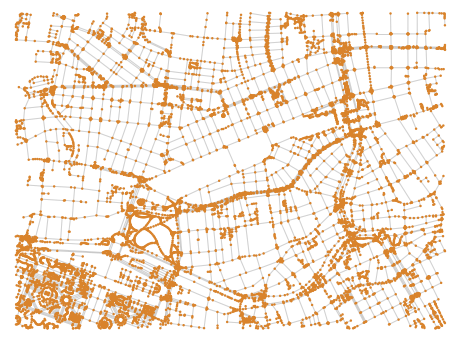

In [2]:
# download streetnetwork from westbahnhofareal bounding box

G = ox.graph_from_bbox(*co.bb_westbahnhofareal, clean_periphery=True, simplify=False, custom_filter=co.walking_filter_wbh, **co.graph_download_options)
fig, ax = ox.plot_graph(G, **co.graph_plot_nodes_options)

G_proj = ox.project_graph(G)

polygon = ox.utils_geo.bbox_to_poly(*co.bb_westbahnhofareal)

In [3]:
# load points of Interest (bicycle rentals from citybike Wien)
pois = ox.geometries.geometries_from_polygon(polygon, {"amenity": ["bicycle_rental"]})
pois = pois[pois.geom_type == 'Point']
pois = pois[pois.network.isin(['Citybike Wien'])]

pois

amenity capacity                        name  \
element_type osmid                                                             
node         298352636   bicycle_rental       30         Margaretengürtel U4   
             298352637   bicycle_rental       20               Arbeitergasse   
             298357578   bicycle_rental       20                Burggasse U6   
             1092658516  bicycle_rental       24               Schmelzbrücke   
             1211592357  bicycle_rental       40     Westbahnhof Europaplatz   
             1268445013  bicycle_rental       27         Gumpendorfer Gürtel   
             1268445029  bicycle_rental       31                         NaN   
             1268445032  bicycle_rental       28                 Meiselmarkt   
             1268445043  bicycle_rental       35               Citybike Wien   
             1268463814  bicycle_rental       22                 Turnergasse   
             1831577919  bicycle_rental       14                    Webgasse   
             1841612498  bicycle_rental       16         Schönbrunner Brücke   
             1845177200  bicycle_rental       25          Urban Loritz Platz   
             1845179705  bicycle_rental       25             Längenfeldgasse   
             1890501996  bicycle_rental       25                 Selzergasse   
             1988874698  bicycle_rental       32     Markgraf-Rüdiger-Straße   
             2071272353  bicycle_rental       25             Schweglerstraße   
             2322786355  bicycle_rental       40    Westbahnhof Felberstraße   
             2322786356  bicycle_rental       25              Wieningerplatz   
             2470474246  bicycle_rental       35  Westbahnhof Gerstnerstraße   
             6105464782  bicycle_rental       40     Schönbrunn Haupteingang   

                               network   ref  start_date  \
element_type osmid                                         
node         298352636   Citybike Wien   503  2004-08-06   
             298352637   Citybike Wien   504  2004-06-05   
             298357578   Citybike Wien   702  2004-06-04   
             1092658516  Citybike Wien  1507  2010-08-09   
             1211592357  Citybike Wien  1501  2011-03-15   
             1268445013  Citybike Wien   602  2010-11-12   
             1268445029  Citybike Wien  1401  2010-11-24   
             1268445032  Citybike Wien  1508  2010-11-23   
             1268445043  Citybike Wien  1506  2010-08-19   
             1268463814  Citybike Wien  1505  2010-10-07   
             1831577919  Citybike Wien   707  2005-12-02   
             1841612498  Citybike Wien  1503  2007-04-26   
             1845177200  Citybike Wien   704  2004-04-16   
             1845179705  Citybike Wien  1201  2007-04-05   
             1890501996  Citybike Wien  1513  2012-08-29   
             1988874698  Citybike Wien  1509  2012-10-24   
             2071272353  Citybike Wien  1515  2012-12-17   
             2322786355  Citybike Wien  1514        2013   
             2322786356  Citybike Wien  1511  2013-05-15   
             2470474246  Citybike Wien  1516  2013-09-24   
             6105464782  Citybike Wien  1301     2018-11   

                                              website wheelchair  \
element_type osmid                                                 
node         298352636   https://www.citybikewien.at/        yes   
             298352637   https://www.citybikewien.at/        NaN   
             298357578   https://www.citybikewien.at/        NaN   
             1092658516  https://www.citybikewien.at/        NaN   
             1211592357  https://www.citybikewien.at/        NaN   
             1268445013  https://www.citybikewien.at/        NaN   
             1268445029  https://www.citybikewien.at/        NaN   
             1268445032  https://www.citybikewien.at/        NaN   
             1268445043  https://www.citybikewien.at/        NaN   
             1268463814  https://www.citybikewien.at/        N

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


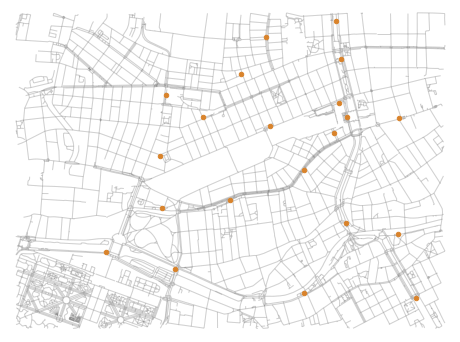

In [4]:
# plot bicycle rental points on map

fig, ax = ox.plot_graph(G, show=False, close=False, **co.graph_plot_options)
pois.plot(ax=ax, markersize = 20, color=co.col_orange , alpha=1, zorder=7)

fig.savefig('figures/pois_citybike.svg')
fig.savefig('figures/pois_citybike.png', bbox_inches='tight')
